Visualizing output data from the Salish Sea Atlantis Model

In [2]:
import os
import xarray as xr
import numpy as np
import geopandas as gpd
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cmocean
import pandas as pd
from PIL import Image
import glob
from IPython.display import Image as img



## Define model grid, scenario and control files

In [3]:
# Salish Sea Atlantis Model Shapefile
shapefile_name = "/ocean/rlovindeer/Atlantis/ssam_oceanparcels/SalishSea/SalishSea_July172019_2/SalishSea_July172019.shp"
data_df = gpd.read_file(shapefile_name)
data_df = data_df.sort_values(by=['BOX_ID'])
box_depth = data_df['BOTZ']
land_boxes = box_depth==0
land_boxes = data_df.index[land_boxes]


In [4]:
# Data file
control_file = "/ocean/rlovindeer/MOAD/analysis-raisha/SSmodel_outputs/Scrubber_discharge_2019_control/outputSalishSea.nc"
scenario1_file = "/ocean/rlovindeer/MOAD/analysis-raisha/SSmodel_outputs/Scrubber_discharge_2019_00/outputSalishSea.nc"
scenario2_file = "/ocean/rlovindeer/MOAD/analysis-raisha/SSmodel_outputs/Scrubber_discharge_2019-2023/outputSalishSea.nc"
scenario3_file = "/ocean/rlovindeer/MOAD/analysis-raisha/SSmodel_outputs/Scrubber_discharge_2019-2029/outputSalishSea.nc"

control = xr.open_dataset(str(control_file), decode_cf=True)
scenario1 = xr.open_dataset(str(scenario1_file), decode_cf=True)
scenario2 = xr.open_dataset(str(scenario2_file), decode_cf=True)
scenario3 = xr.open_dataset(str(scenario3_file), decode_cf=True)

scenario1_name = ' discharge_2019_only'
scenario2_name = ' discharge_2019-2023'
scenario3_name = ' discharge_2019-2028'

project_keyword = 'Scrubber'

In [5]:
# Select data times
t = np.ma.filled(control.variables['t'], np.nan)

start = 101
end = t.size-1

time = t[start:end]

spill_start = np.datetime64('2019-01-01')
spill_end = np.datetime64('2028-12-31')

## Output map functions

In [6]:
def compare_pelagic_aggregate_time(variable_name):
    # map of single variable ratio across the whole simulation

    # Pull variables for all scenarios
    dVar_control = control.variables[variable_name]
    dVar_s1 = scenario1.variables[variable_name]
    dVar_s2 = scenario2.variables[variable_name]
    dVar_s3 = scenario3.variables[variable_name]

    # Aggregate across depths
    dVar_control = dVar_control.sum(axis=2)
    dVar_s1 = dVar_s1.sum(axis=2)
    dVar_s2 = dVar_s2.sum(axis=2)
    dVar_s3 = dVar_s3.sum(axis=2)

    _cmap = cm.bwr # cm.ocean_r
    land_df = data_df.loc[land_boxes]
    v_min = 0.5
    v_max = 1.5

    ## Aggregate across time
    dVar_control = dVar_control.sum(axis=0)
    dVar_s1 = dVar_s1.sum(axis=0)
    dVar_s2 = dVar_s2.sum(axis=0)
    dVar_s3 = dVar_s3.sum(axis=0)

    s1_oil = dVar_s1 / dVar_control 
    s2_oil = dVar_s2 / dVar_control 
    s3_oil = dVar_s3 / dVar_control 

    # ## Select specific time period
    # time_index = 110
    # dVar_control = dVar_control[time_index,:]
    # dVar_s1 = dVar_s1[time_index,:]
    # dVar_s2 = dVar_s2[time_index,:]
    # dVar_s3 = dVar_s3[time_index,:]

    # s1_oil = dVar_s1 / dVar_control 
    # s2_oil = dVar_s2 / dVar_control 
    # s3_oil = dVar_s3 / dVar_control 

    # Add scenario data to Atlantis spatial data
    data_df['scen_1'] = s1_oil
    data_df['scen_2'] = s2_oil
    data_df['scen_3'] = s3_oil
    data_df.loc[land_boxes, 'scen_1'] = 0
    data_df.loc[land_boxes, 'scen_2'] = 0
    data_df.loc[land_boxes, 'scen_3'] = 0

    fig = plt.figure(figsize=(18, 8), facecolor='white') #figsize=(9, 12)
    gs = plt.GridSpec(1, 3, wspace=0.5, hspace=0.2, width_ratios=[1, 1, 1], height_ratios=[1],)

    ax = fig.add_subplot(gs[0, 0])    
    ax = data_df.plot(column = 'scen_1', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax,
        legend=True, legend_kwds={'label': variable_name + scenario1_name
        },)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white')

    ax = fig.add_subplot(gs[0, 1])
    ax = data_df.plot(column = 'scen_2', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax,
        legend=True, legend_kwds={'label': variable_name + scenario2_name
        },)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white') 

    ax = fig.add_subplot(gs[0, 2])
    ax = data_df.plot(column = 'scen_3', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax,
        legend=True, legend_kwds={'label': variable_name + scenario3_name
        },)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white');
    
    return

In [35]:

def compare_pelagic_single_time(variable_name, time_index):
    # map of single variable ratio at a specific time index
    
    ts_date = np.array(t[time_index])

    # Pull variables for all scenarios
    dVar_control = control.variables[variable_name]
    dVar_s1 = scenario1.variables[variable_name]
    dVar_s2 = scenario2.variables[variable_name]
    dVar_s3 = scenario3.variables[variable_name]

    # Aggregate across depths
    dVar_control = dVar_control.sum(axis=2)
    dVar_s1 = dVar_s1.sum(axis=2)
    dVar_s2 = dVar_s2.sum(axis=2)
    dVar_s3 = dVar_s3.sum(axis=2)

    label_size = 11
    font_size = 12
    line_width = 2
    _cmap = cm.PuOr_r #cm.bwr # cm.ocean_r
    land_df = data_df.loc[land_boxes]
    v_min = 0.5
    v_max = 1.5
    t_min = dVar_control.min
    t_max = dVar_control.max
    print(t_min, t_max)

    ## Select specific time period
    tVar_control = dVar_control[time_index,:]
    tVar_s1 = dVar_s1[time_index,:]
    tVar_s2 = dVar_s2[time_index,:]
    tVar_s3 = dVar_s3[time_index,:]

    s1_oil = tVar_s1 / tVar_control 
    s2_oil = tVar_s2 / tVar_control 
    s3_oil = tVar_s3 / tVar_control 

    # Add scenario data to Atlantis spatial data
    data_df['scen_1'] = s1_oil
    data_df['scen_2'] = s2_oil
    data_df['scen_3'] = s3_oil
    data_df.loc[land_boxes, 'scen_1'] = 0
    data_df.loc[land_boxes, 'scen_2'] = 0
    data_df.loc[land_boxes, 'scen_3'] = 0

    # fig = plt.figure(figsize=(18, 8), facecolor='white')
    # gs = plt.GridSpec(1, 3, wspace=0.2, hspace=0.2, width_ratios=[1, 1, 1], height_ratios=[1],)

    fig = plt.figure(figsize=(18, 15), facecolor='white')
    gs = plt.GridSpec(2, 3, wspace=0.1, hspace=0.2, width_ratios=[1, 1, 1], height_ratios=[1, 4])

    ax_ts = fig.add_subplot(gs[0, :])
    ax_ts.plot(time, dVar_s1.sum(axis=1)[start:end], time, dVar_s2.sum(axis=1)[start:end], time, dVar_s3.sum(axis=1)[start:end], time, dVar_control.sum(axis=1)[start:end], 'k', linewidth = line_width)
    ax_ts.plot([ts_date, ts_date], [t_min, t_max], 'k--')
    ax_ts.plot([spill_start, spill_start], [t_min, t_max], 'r', linewidth = 10, alpha=0.4)
    ax_ts.set_ylabel('variable units', fontsize = label_size)
    ax_ts.legend(('scenario1', 'scenario2', 'scenario3', 'control'), loc='center right')
    ax_ts.tick_params(labelsize=label_size)

    ax = fig.add_subplot(gs[1, 0])
    ax = data_df.plot(column = 'scen_1', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax,
         legend=True, 
        # legend_kwds={'label': variable_name + scenario1_name },
        )
    ax.set_title(variable_name + scenario1_name, fontsize = 12)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white')

    ax = fig.add_subplot(gs[1, 1])
    ax = data_df.plot(column = 'scen_2', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax,
         legend=True, 
        # legend_kwds={'label': variable_name + scenario2_name },
        )
    ax.set_title(variable_name + scenario2_name, fontsize = 12)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white') 

    ax = fig.add_subplot(gs[1, 2])
    # divider = make_axes_locatable(ax)
    # _cax = divider.append_axes('right',size='5%', pad=0.1)
    ax = data_df.plot(column = 'scen_3', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax, #cax=_cax,
        legend=True, legend_kwds={'label': 'scenario : control'
        },)
    ax.set_title(variable_name + scenario3_name, fontsize = 12)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white');
    ax = fig.suptitle(project_keyword + ', ' + variable_name + ' at ' + str(ts_date), fontsize=12)
    #ax.legend(cmap=_cmap) 

    return

In [8]:

def compare_benthic_single_time(variable_name, time_index):
    # map of single variable ratio at a specific time index
    
    ts_date = np.array(t[time_index])

    # Pull variables for all scenarios
    dVar_control = control.variables[variable_name]
    dVar_s1 = scenario1.variables[variable_name]
    dVar_s2 = scenario2.variables[variable_name]
    dVar_s3 = scenario3.variables[variable_name]

    _cmap = cm.PuOr_r #cm.bwr # cm.ocean_r
    land_df = data_df.loc[land_boxes]
    v_min = 0.5
    v_max = 1.5

    ## Select specific time period
    dVar_control = dVar_control[time_index,:]
    dVar_s1 = dVar_s1[time_index,:]
    dVar_s2 = dVar_s2[time_index,:]
    dVar_s3 = dVar_s3[time_index,:]

    s1_oil = dVar_s1 / dVar_control 
    s2_oil = dVar_s2 / dVar_control 
    s3_oil = dVar_s3 / dVar_control 

    # Add scenario data to Atlantis spatial data
    data_df['scen_1'] = s1_oil
    data_df['scen_2'] = s2_oil
    data_df['scen_3'] = s3_oil
    data_df.loc[land_boxes, 'scen_1'] = 0
    data_df.loc[land_boxes, 'scen_2'] = 0
    data_df.loc[land_boxes, 'scen_3'] = 0

    fig = plt.figure(figsize=(18, 8), facecolor='white')
    gs = plt.GridSpec(1, 3, wspace=0.2, hspace=0.2, width_ratios=[1, 1, 1], height_ratios=[1],)

    ax = fig.add_subplot(gs[0, 0])
    ax = data_df.plot(column = 'scen_1', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax,
         legend=True, 
        # legend_kwds={'label': variable_name + scenario1_name },
        )
    ax.set_title(variable_name + scenario1_name, fontsize = 12)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white')

    ax = fig.add_subplot(gs[0, 1])
    ax = data_df.plot(column = 'scen_2', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax,
         legend=True, 
        # legend_kwds={'label': variable_name + scenario2_name },
        )
    ax.set_title(variable_name + scenario2_name, fontsize = 12)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white') 

    ax = fig.add_subplot(gs[0, 2])
    # divider = make_axes_locatable(ax)
    # _cax = divider.append_axes('right',size='5%', pad=0.1)
    ax = data_df.plot(column = 'scen_3', cmap=_cmap, vmin=v_min, vmax=v_max, ax=ax, #cax=_cax,
        legend=True, legend_kwds={'label': 'scenario : control'
        },)
    ax.set_title(variable_name + scenario3_name, fontsize = 12)
    data_df.boundary.plot(ax=ax, color='grey', linewidths=0.7)
    land_df.plot(ax=ax, color='white');
    ax = fig.suptitle('Ratio of Control to Scenario at time ' + str(ts_date), fontsize=12)
    #ax.legend(cmap=_cmap) 

    return

In [9]:
def animate_compare_pelagic(variable_name):
    # animation of single variable ratio over time

    file_names = []

    for time_index in range(start, end):
    
        compare_pelagic_single_time(variable_name, time_index)
        
        plot_name = variable_name + '_' + str(time_index).zfill(3) + '.png'
        plt.savefig(plot_name)
        file_names.append(plot_name)
        plt.close()

    frames = []
    imgs = glob.glob("*.png")
    imgs.sort() 
    for i in imgs:
        new_frame = Image.open(i)
        frames.append(new_frame)

    # Save frames into a loop
    anim_name = str(project_keyword) + '_' + variable_name + '.gif'
    frames[0].save(anim_name, format='GIF',
                append_images=frames[1:],
                save_all=True,
                duration=300, loop=0)

    file_name_str = ' '.join(file_names)
    os.system('rm ' + file_name_str)

    # Display the figure
    with open(anim_name,'rb') as anim:
        display(img(anim.read()))
    
    return

In [10]:
def animate_compare_benthic(variable_name):
    # animation of single variable ratio over time

    file_names = []

    for time_index in range(start, end):
    
        compare_benthic_single_time(variable_name, time_index)
        
        plot_name = variable_name + '_' + str(time_index).zfill(3) + '.png'
        plt.savefig(plot_name)
        file_names.append(plot_name)
        plt.close()

    frames = []
    imgs = glob.glob("*.png")
    imgs.sort() 
    for i in imgs:
        new_frame = Image.open(i)
        frames.append(new_frame)

    # Save frames into a loop
    anim_name = str(project_keyword) + '_' + variable_name + '.gif'
    frames[0].save(anim_name, format='GIF',
                append_images=frames[1:],
                save_all=True,
                duration=300, loop=0)

    file_name_str = ' '.join(file_names)
    os.system('rm ' + file_name_str)

    # Display the figure
    with open(anim_name,'rb') as anim:
        display(img(anim.read()))
    
    return

In [17]:
def animate_benthic_biomass(variable_name, scenario_number, scenario_name):

    # assign variables & calculate ratio
    benthic_control = control.variables[variable_name]
    benthic_scenario = scenario_number.variables[variable_name]
    
    benthic_control = benthic_control[start:end][:]
    benthic_scenario = benthic_scenario[start:end][:]
    
    ratio = benthic_scenario / benthic_control

    # sum across boxes for top plot
    all_control = benthic_control.sum(axis=1)   
    all_scenario =benthic_scenario.sum(axis=1)

    # map properties
    label_size = 11
    font_size = 12
    line_width = 2
    _cmap1 = cm.Blues #cmocean.cm.haline
    _cmap2 = cm.PuOr_r #BrBG #cm.cividis viridis #Paired bwr twilight_shifted coolwarm_r
    #_cmap2 = create_colormap('#006fff','#ffffff','#ff9000')

    file_names = []
    land_df = data_df.loc[land_boxes]
    
    # plot axes max and min 
    v_min = np.min(benthic_scenario[-1])
    v_max = np.max(benthic_control[-1])
    all_min = np.min(all_scenario)
    all_max = np.max(all_control)

    for time_index in range(0, time.size-1): #(start, end):
    
        t_scen = benthic_scenario[time_index][:]
        #t_control = benthic_control[time_index][:]
        t_ratio = ratio[time_index][:]
        ts_date = time[time_index]
        #ts_date = np.datetime64(str(time[time_index]))
        #ts_date = pd.to_datetime(str(time[time_index]))
        
        data_df['scen'] = t_scen
        data_df['control'] = t_control
        data_df['ratio'] = t_ratio
        data_df.loc[land_boxes, 'oiled'] = 0

        fig = plt.figure(figsize=(18, 15), facecolor='white')
        gs = plt.GridSpec(2, 2, wspace=0.1, hspace=0.2, width_ratios=[1, 1, 1], height_ratios=[1, 4])

        ax_ts = fig.add_subplot(gs[0, :])
        ax_ts.plot(time, all_scenario, '.',time, all_control, 'k.', linewidth = line_width)
        ax_ts.plot([ts_date, ts_date], [all_min, all_max], 'k--')
        ax_ts.plot([spill_start, spill_start], [all_min, all_max], 'r', linewidth = 10, alpha=0.4)
        ax_ts.set_title(project_keyword + scenario_name + ', ' + variable_name, fontsize = font_size)
        #ax_ts.set_ylabel('tonnes', fontsize = label_size)
        ax_ts.legend(('scenario', 'control'), loc='center right')
        ax_ts.tick_params(labelsize=label_size)

        ax = fig.add_subplot(gs[1, 0])
        ax = data_df.plot(column='scen', cmap=_cmap1, 
            vmin=v_min, vmax=v_max, ax=ax, legend=True,
        #legend_kwds={'label': "variable units"},
            )  
        ax.set_title("Scenario" + scenario_name + '_' + variable_name)
        data_df.boundary.plot(ax=ax, color="grey", linewidths=0.7)
        land_df.plot(ax=ax, color='white')   

        # ax = fig.add_subplot(gs[1, 1])
        # ax = data_df.plot(column='control', cmap=_cmap1, 
        #     vmin=v_min, vmax=v_max, ax=ax, legend=True,
        # #legend_kwds={'label': "variable units"},
        #     )  
        # ax.set_title("Control_" + variable_name)
        # data_df.boundary.plot(ax=ax, color="grey", linewidths=0.7)
        # land_df.plot(ax=ax, color='white')   

        ax = fig.add_subplot(gs[1, 1])
        ax = data_df.plot(column='ratio', cmap=_cmap2, vmin=0.5, vmax=1.5, ax=ax, 
        legend=True, 
        legend_kwds={'label': "scenario : control"},
            )
        ax.set_title("Ratio of Scenario to Control " + variable_name)    #ax.set_title(oiled_time[time_index])
        data_df.boundary.plot(ax=ax, color="grey", linewidths=0.7)
        land_df.plot(ax=ax, color='white') 
        
        #plt.tight_layout()
        plot_name = variable_name + '_time_' + str(time_index).zfill(3) + '.png'
        plt.savefig(plot_name)
        file_names.append(plot_name)
        plt.close()

    # Create the frames
    frames = []
    imgs = glob.glob("*.png")
    imgs.sort() 
    for i in imgs:
        new_frame = Image.open(i)
        frames.append(new_frame)

    # Save frames into a loop
    anim_name = project_keyword + '_' + scenario_name + '_' + variable_name + '.gif'
    frames[0].save(anim_name, format='GIF',
                append_images=frames[1:],
                save_all=True,
                duration=200, loop=0)

    file_name_str = ' '.join(file_names)
    os.system('rm ' + file_name_str)

    # Display the figure
    with open(anim_name,'rb') as anim:
        display(img(anim.read()))

## Maps & animations of model ouput

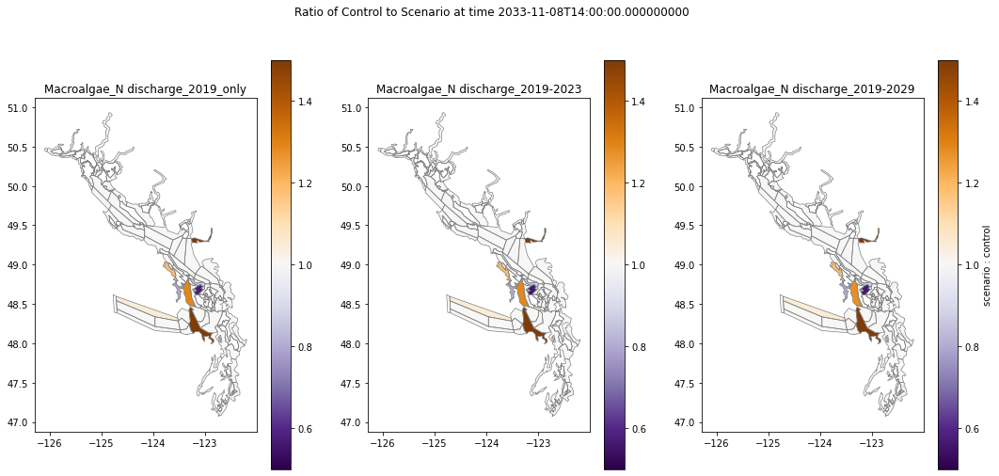

In [240]:
compare_benthic_single_time('Macroalgae_N', end) #scenario2.variables[variable_name]

/tmp/ipykernel_2411140/2809471876.py:23: RuntimeWarning: invalid value encountered in true_divide
  s1_oil = dVar_s1 / dVar_control
/tmp/ipykernel_2411140/2809471876.py:24: RuntimeWarning: invalid value encountered in true_divide
  s2_oil = dVar_s2 / dVar_control
/tmp/ipykernel_2411140/2809471876.py:25: RuntimeWarning: invalid value encountered in true_divide
  s3_oil = dVar_s3 / dVar_control


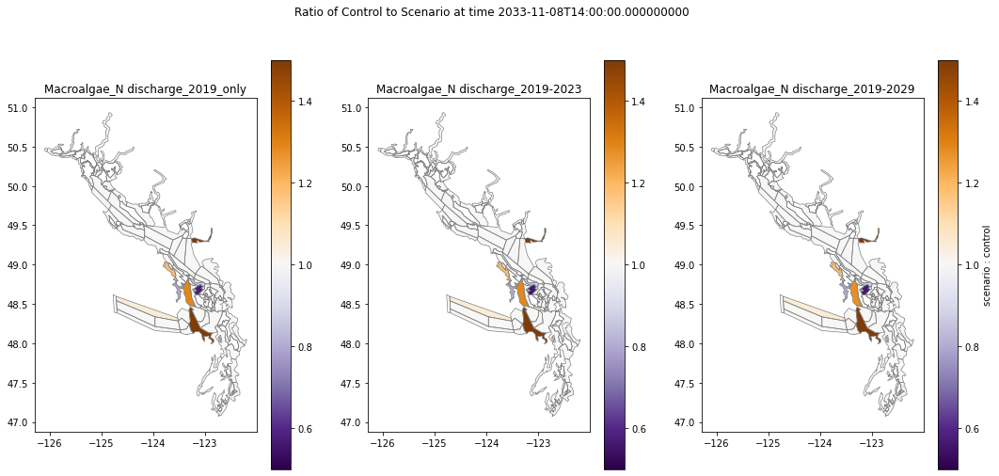

In [12]:
compare_benthic_single_time('Macroalgae_N', end) #np.ma.filled(scenario1.variables[variable_name], np.nan)

<bound method ImplementsArrayReduce._reduce_method.<locals>.wrapped_func of <xarray.Variable (t: 169, b: 130)>
array([[2.23445591e-001, 1.22004030e-001, 1.63120816e-001, ...,
        0.00000000e+000, 0.00000000e+000, 8.43160558e-002],
       [2.07290432e-011, 1.08603678e-001, 1.40207306e+000, ...,
        0.00000000e+000, 0.00000000e+000, 7.82199889e-012],
       [1.92303295e-021, 1.43778252e-001, 5.79064402e+000, ...,
        0.00000000e+000, 0.00000000e+000, 7.25646688e-022],
       ...,
       [9.88131292e-323, 1.34863999e+005, 3.41003283e+004, ...,
        0.00000000e+000, 0.00000000e+000, 7.90505033e-323],
       [9.88131292e-323, 1.34655897e+005, 3.40749629e+004, ...,
        0.00000000e+000, 0.00000000e+000, 7.90505033e-323],
       [9.88131292e-323, 1.34326121e+005, 3.40435537e+004, ...,
        0.00000000e+000, 0.00000000e+000, 7.90505033e-323]])> <bound method ImplementsArrayReduce._reduce_method.<locals>.wrapped_func of <xarray.Variable (t: 169, b: 130)>
array([[2.23445591e-

TypeError: float() argument must be a string or a number, not 'method'

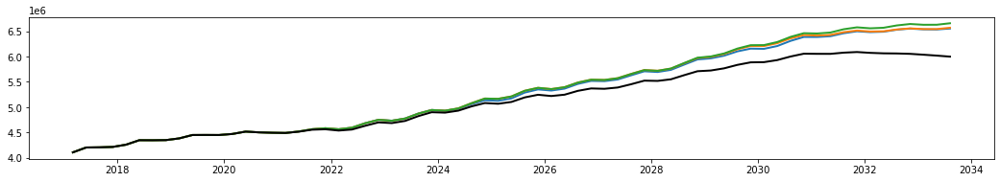

In [36]:
compare_pelagic_single_time('Diatom_N', end)

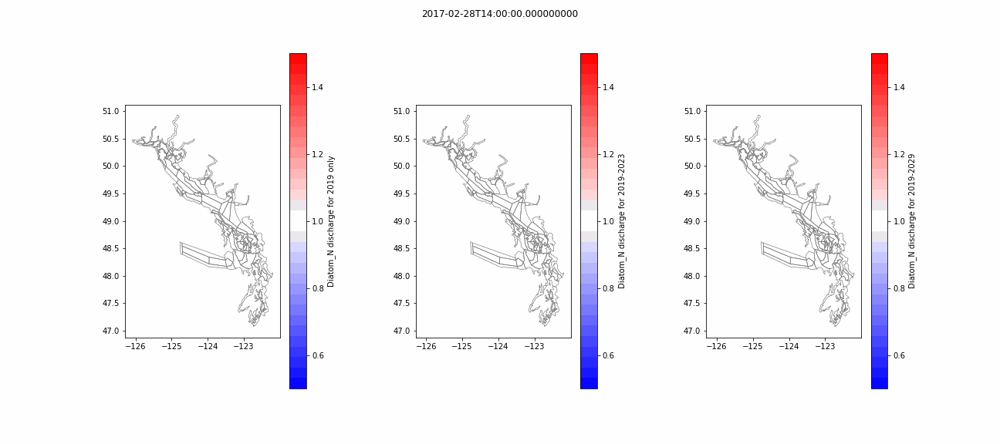

In [61]:
animate_compare_pelagic('Diatom_N')

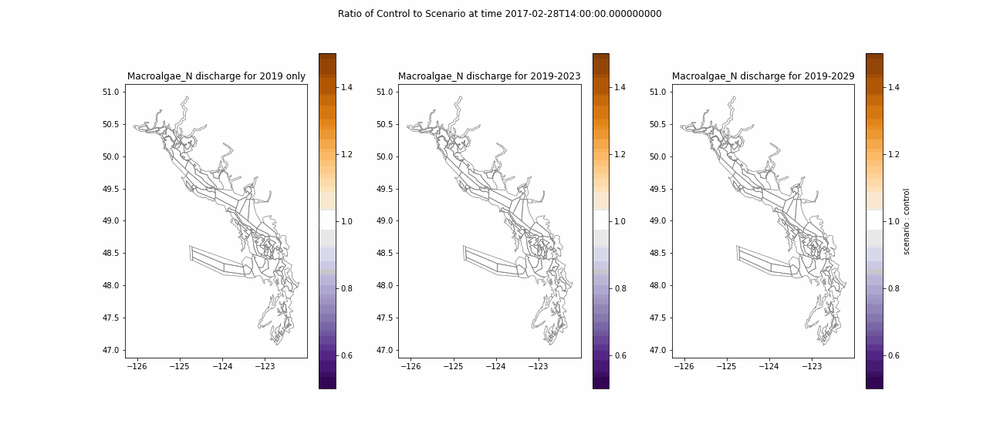

In [220]:
animate_compare_benthic('Macroalgae_N')

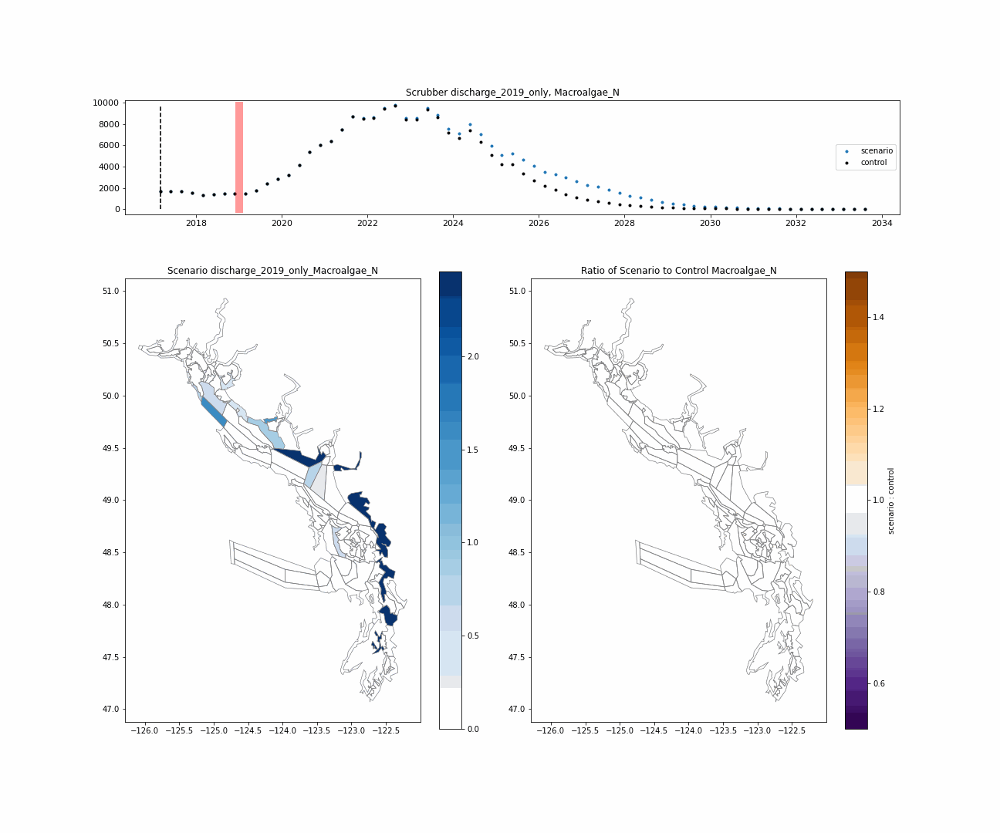

In [235]:
animate_benthic_biomass('Macroalgae_N', scenario1, scenario1_name) 

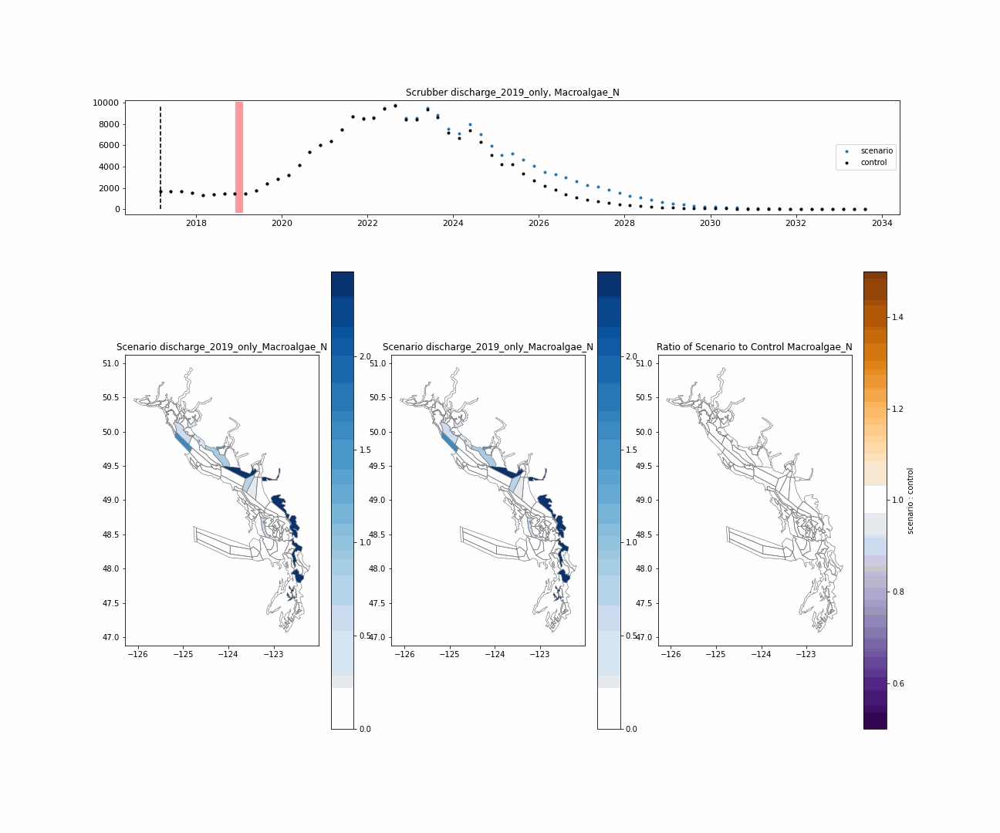

In [18]:
animate_benthic_biomass('Macroalgae_N', scenario1, scenario1_name)

In [ ]:
# Animation

scenario = 'Control'
data_file = "/ocean/rlovindeer/MOAD/analysis-raisha/SSmodel_outputs/Control_04SS_75y/outputSalishSea.nc"
variable_name = 'Diatom_N'

data = xr.open_dataset(str(data_file), decode_cf=True)

time = data.variables['t']
dVar = data.variables[variable_name]
dVar = dVar.sum(axis=2)

_cmap = cm.ocean_r

file_names = []

land_df = data_df.loc[land_boxes]
num_steps = time.shape[0]
print(num_steps)
v_min = np.min(dVar)
v_max = np.max(dVar)

for time_index in range(0, num_steps):
   
    t_oil = dVar[time_index]
    ts_date = np.array(time[time_index])
    
    data_df['oiled'] = t_oil
    data_df.loc[land_boxes, 'oiled'] = 0
    
    ax = data_df.plot(figsize=(9, 12), column = 'oiled', cmap=_cmap,
        vmin=v_min, vmax=v_max, 
        legend=True, legend_kwds={'label': variable_name
        },)
    ax.set_title(ts_date, fontsize = 15)
    data_df.boundary.plot(ax=ax, color="grey", linewidths=0.7)
    land_df.plot(ax=ax, color='white')   
    
    #plt.tight_layout()
    plot_name = variable_name + '_' + str(time_index).zfill(3) + '.png'
    plt.savefig(plot_name)
    file_names.append(plot_name)
    plt.close()


# Create the frames
frames = []
imgs = glob.glob("*.png")
imgs.sort() 
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)

# Save frames into a loop
anim_name = str(scenario) + '_' + variable_name + '.gif'
frames[0].save(anim_name, format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)

file_name_str = ' '.join(file_names)
os.system('rm ' + file_name_str)

# Display the figure
with open(anim_name,'rb') as anim:
    display(img(anim.read()))

## Ratio of scenario to control

In [6]:
def box_total(data, control, species):
    
    data_all = np.ma.filled(data.variables[species], np.nan)
    data_all_depths = data_all.sum(axis=2)
    
    control_all = np.ma.filled(control.variables[species], np.nan)
    control_all_depths = control_all.sum(axis=2)

    return data_all_depths, control_all_depths

def model_total(data, control, species):
    
    data_all = np.ma.filled(data.variables[species], np.nan)
    data_all_depths = data_all.sum(axis=2)
    data_all_boxes = data_all_depths.sum(axis=1)
    
    control_all = np.ma.filled(control.variables[species], np.nan)
    control_all_depths = control_all.sum(axis=2)
    control_all_boxes = control_all_depths.sum(axis=1)

    return data_all_boxes, control_all_boxes

def cohort_total_perbox(data, species_name, numCohorts):

    numbers = np.ma.zeros((data.variables[species_name + '1_Nums'].shape),dtype = np.int32)
    structuralN = np.ma.zeros((data.variables[species_name + '1_StructN'].shape),dtype = np.int32)
    reservedN = np.ma.zeros((data.variables[species_name + '1_ResN'].shape),dtype = np.int32)

    for cohort in range (1, numCohorts+1):

        species = species_name + str(cohort)
        
        numbers = numbers + np.ma.filled(data.variables[species + '_Nums'][:,:,:], np.nan)
        structuralN = structuralN + np.ma.filled(data.variables[species +'_StructN'][:,:,:], np.nan)
        reservedN = reservedN + np.ma.filled(data.variables[species +'_ResN'][:,:,:], np.nan)

    numbers = numbers.sum(axis=2)
    structuralN = structuralN.sum(axis=2)
    reservedN = reservedN.sum(axis=2)
    
    return numbers, structuralN, reservedN 

def create_colormap(hex_1 = '#000000', hex_2 = '#FFFFFF', hex_3 = None):
    rgb_1 = mcolors.to_rgb(hex_1)
    rgb_2 = mcolors.to_rgb(hex_2)
    rgb_3 = mcolors.to_rgb(hex_3) if hex_3 else None

    steps = 128 if rgb_3 else 256
    gradient = np.ones((steps, 4))
    gradient[:, 0] = np.linspace(rgb_1[0], rgb_2[0], steps)
    gradient[:, 1] = np.linspace(rgb_1[1], rgb_2[1], steps)
    gradient[:, 2] = np.linspace(rgb_1[2], rgb_2[2], steps)

    if rgb_3:
        second_gradient = np.ones((steps, 4))
        second_gradient[:, 0] = np.linspace(rgb_2[0], rgb_3[0], steps)
        second_gradient[:, 1] = np.linspace(rgb_2[1], rgb_3[1], steps)
        second_gradient[:, 2] = np.linspace(rgb_2[2], rgb_3[2], steps)

        gradient = np.vstack((gradient, second_gradient))

    return mcolors.ListedColormap(gradient)


In [7]:
# Age-structured species cohort numbers
cohorts = {
    'Benthopelagic':10, 'Small_Demersal_fish':10, 'Small_Flatfish':10, 'Small_pelagic_fish':7,
    'Chinook_salmon':5, 'Chum_salmon':5, 'Coho_salmon':5,'Pink_salmon':5, 'Sockeye_salmon':5, 
    'Other_salmonids':8,'Hatchery_Chinook_salmon':3,'Hatchery_Coho_salmon':3,'Hatchery_Sockeye_salmon':3,
    'Dogfish':10,'Ratfish':10,'Rockfish':10,'Sixgill':10,'Hake':10,
    'Harbor_porpoise':10, 'Harbor_seals':10,'Humpback_whales':10,
    'Large_Demersal_fish':10, 'Large_Flatfish' :10,'Lingcod' :10,
    'Orcas_resident':10, 'Orcas_transient':10,
    'Pacific_herring':10,'Pollock':10,'Sandlance':7, 
    'Seabird_gulls':10, 'Seabirds':10,'Sealions':10,'Skates':10,
}

In [1]:
label_size = 12
font_size = 16
line_width = 2

#### Plotting the impact of an oil spill scenario on age-structured species within the Salish Sea

In [9]:
# Age Structured Species
species = 'Pacific_herring'
numCohorts = cohorts[species]

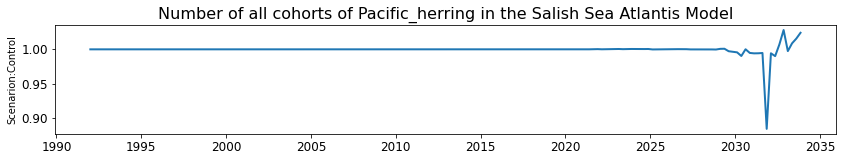

In [11]:
# Age-structured species
num_oiled, sN_oiled, rN_oiled = cohort_total_perbox(data, species, numCohorts)
num_control, sN_control, rN_control = cohort_total_perbox(control, species, numCohorts)

model_numbers = num_oiled.sum(axis=1) / num_control.sum(axis=1)

fig, ax = plt.subplots(figsize = (14,2))
ax.plot(time, model_numbers, linewidth = line_width)
ax.set_title('Number of all cohorts of ' + species + ' in the Salish Sea Atlantis Model', fontsize = font_size)
ax.set_ylabel('Scenarion:Control')
ax.tick_params(labelsize=label_size)

In [ ]:

_cmap1 = cm.Blues
_cmap2 = cm.PuOr_r # cm.twilight_shifted winter #viridis #Paired bwr  coolwarm_r

file_names = []

land_df = data_df.loc[land_boxes]
num_steps = oiled_time.shape[0]
v_min = np.min(num_oiled[-1])
v_max = np.max(num_control[-1])

n_min = np.min(model_numbers_oiled)
n_max = np.max(model_numbers_control)

for time_index in range(0, num_steps):
   
    t_oil = num_oiled[time_index][:]
    t_control = num_control[time_index][:]
    ts_date = pd.to_datetime(str(oiled_time[time_index]))
    spill_date = pd.to_datetime(str(oiled_time[1]))
    
    data_df['oiled'] = t_oil
    data_df['diff'] = (t_oil - t_control)
    data_df.loc[land_boxes, 'oiled'] = 0

    fig = plt.figure(figsize=(18, 15), facecolor='white')
    gs = plt.GridSpec(2, 2, wspace=0.1, hspace=0.1, width_ratios=[9, 9], height_ratios=[1, 4])

    ax_ts = fig.add_subplot(gs[0, :])
    ax_ts.plot(oiled_time, model_numbers_oiled, '.',control_time[0:108], model_numbers_control[0:108], 'k.', linewidth = line_width)
    ax_ts.plot([ts_date, ts_date], [n_min, n_max], 'k--')
    ax_ts.plot([spill_date, spill_date], [n_min, n_max], 'r', linewidth = 15, alpha=0.4)
    ax_ts.set_title('Total numbers of ' + species + ' across all Salish Sea Atlantis Boxes', fontsize = font_size)
    ax_ts.set_ylabel('Abundance', fontsize = label_size)
    ax_ts.legend(('oil scenario', 'control'), loc='lower right')
    ax_ts.tick_params(labelsize=label_size)

    ax = fig.add_subplot(gs[1, 0])
    ax = data_df.plot(column='oiled', cmap=_cmap1,
        vmin=v_min, vmax=v_max, ax=ax, legend=True,
    legend_kwds={'label': "Abundance"
                },)  
    ax.set_title("Oil Scenario " + species + ' Abundance') # + str(ts_date))
    data_df.boundary.plot(ax=ax, color="grey", linewidths=0.7)
    land_df.plot(ax=ax, color='white')   

    ax = fig.add_subplot(gs[1, 1])
    ax = data_df.plot(column='diff', cmap=_cmap2,
        vmin=-v_max, vmax=v_max, ax=ax, legend=True,
    legend_kwds={'label': "<-- decrease in biomass        increase in biomass-->"
                 },)
    ax.set_title("Oil Scenario relative to Control")
    data_df.boundary.plot(ax=ax, color="grey", linewidths=0.7)
    land_df.plot(ax=ax, color='white') 
    
    
    #plt.tight_layout()
    plot_name = species + '_time_' + str(time_index).zfill(3) + '.png'
    plt.savefig(plot_name)
    file_names.append(plot_name)
    plt.close()


# Create the frames
frames = []
imgs = glob.glob("*.png")
imgs.sort() 
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)

# Save frames into a loop
anim_name = str(scenario) + '_' + species +'.gif'
frames[0].save(anim_name, format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=200, loop=0)

file_name_str = ' '.join(file_names)
os.system('rm ' + file_name_str)

# Display the figure
with open(anim_name,'rb') as anim:
    display(img(anim.read()))

#### Plotting the impact of an oil spill scenario on biomass-based benthic species in the Salish Sea

Macroalgae, Benthic_grazer, Bivalves, Crabs, Dungeness_crabs, Filter_feeder, Macrobenthos, Seagrass, Sponges

rm: cannot remove 'Macroalgae_N': No such file or directory
rm: cannot remove 'discharge': No such file or directory
rm: cannot remove 'for': No such file or directory
rm: cannot remove '2019': No such file or directory
rm: cannot remove 'only_time_000.png': No such file or directory
rm: cannot remove 'Macroalgae_N': No such file or directory
rm: cannot remove 'discharge': No such file or directory
rm: cannot remove 'for': No such file or directory
rm: cannot remove '2019': No such file or directory
rm: cannot remove 'only_time_001.png': No such file or directory
rm: cannot remove 'Macroalgae_N': No such file or directory
rm: cannot remove 'discharge': No such file or directory
rm: cannot remove 'for': No such file or directory
rm: cannot remove '2019': No such file or directory
rm: cannot remove 'only_time_002.png': No such file or directory
rm: cannot remove 'Macroalgae_N': No such file or directory
rm: cannot remove 'discharge': No such file or directory
rm: cannot remove 'for': No 

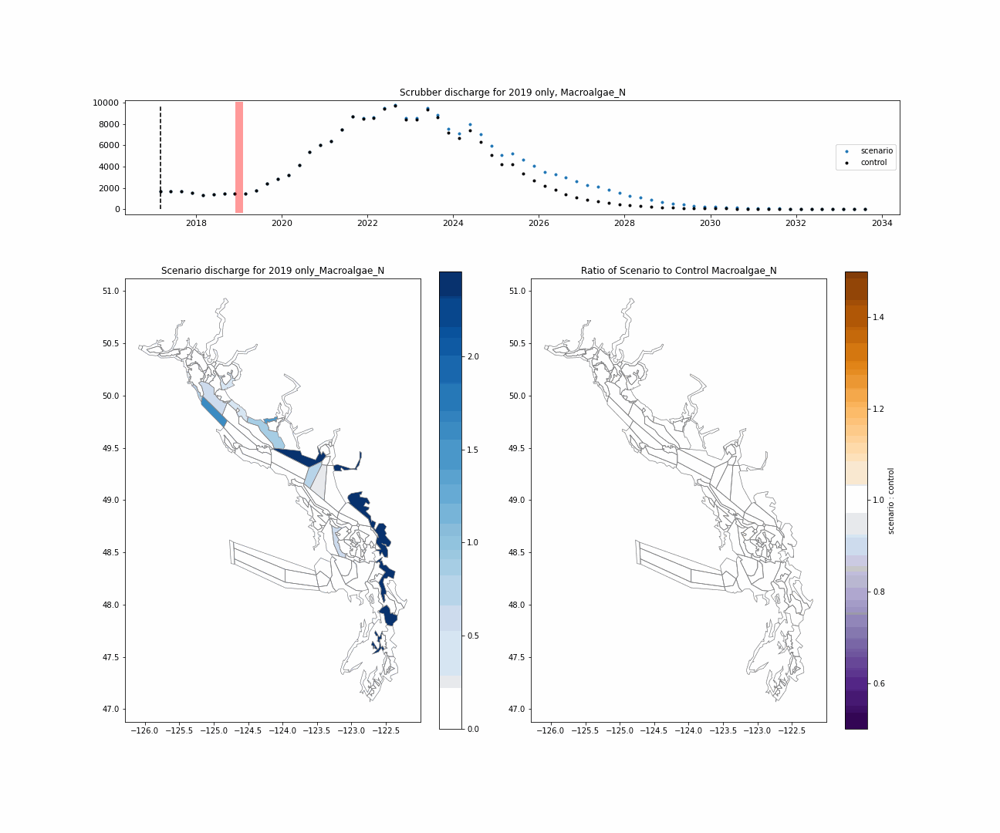

In [197]:
animate_map_benthic('Macroalgae_N', scenario1, scenario1_name)

In [ ]:
animate_map_benthic('Macroalgae_N', scenario3, scenario3_name)

In [120]:
macroa.shape

(169, 130)

In [ ]:

# Save frames into a loop
anim_name = 'Scrubber_' + benthic_species_name +'.gif'
frames[0].save(anim_name, format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=200, loop=0)

file_name_str = ' '.join(file_names)
os.system('rm ' + file_name_str)

# Display the figure
with open(anim_name,'rb') as anim:
    display(img(anim.read()))